In [22]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns


from ISLP import load_data    # ISLP library for the book, it has built in functions and methods to build models 

from sklearn.discriminant_analysis import (LinearDiscriminantAnalysis as LDA, QuadraticDiscriminantAnalysis as QDA)
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression as LR
from sklearn.metrics import confusion_matrix, accuracy_score

#For inline plotting 
%matplotlib inline                 
%config InlineBackend.figure_format = 'svg'


sns.set(style="white") # Plot parameters defined globally
plt.style.use("seaborn-v0_8-white")     

## *16) Classification with Boston dataset*

In [23]:
df_boston = load_data('Boston')

df_boston.head()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,lstat,medv
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,5.33,36.2


### Check https://islp.readthedocs.io/en/latest/datasets/Boston.html for the meaning of each attribute in the data set 

In [24]:
df_boston['crim01'] = np.where(df_boston['crim'] > df_boston['crim'].median(),1,0)

df_boston.head()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,lstat,medv,crim01
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296,15.3,4.98,24.0,0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242,17.8,9.14,21.6,0
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242,17.8,4.03,34.7,0
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222,18.7,2.94,33.4,0
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222,18.7,5.33,36.2,0


In [25]:
predictors_list = df_boston.columns.drop(['crim','crim01']).tolist()

predlist1 = predictors_list[:6] + ['crim','crim01']
predlist2 = predictors_list[6:] + ['crim','crim01']

In [26]:
sns.set()

sns.pairplot(df_boston[predlist1], kind='scatter', hue = 'crim01' )

plt.show()

### zn, indus, chas, nox and age all seem to have a good amount of relation to crim01. Room per dwelling (rm) does not seem to be a strong indicator of the crim01 variable we generated as there are many 0 and 1 class within clustered within the same range of room numbers. Age (proportion of owner-occupied units built prior to 1940) could be some indicator as there seem to be more of type 1 class on the higher end of this variable 

<Axes: xlabel='crim01', ylabel='nox'>

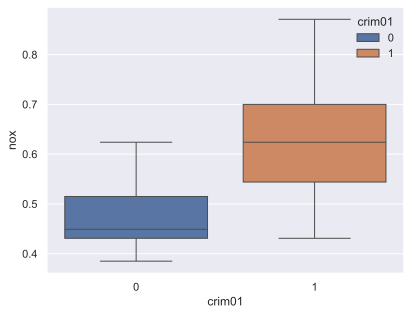

In [27]:
sns.boxplot(x = 'crim01', y = 'nox', data = df_boston,  hue = 'crim01')

<Axes: xlabel='crim01', ylabel='age'>

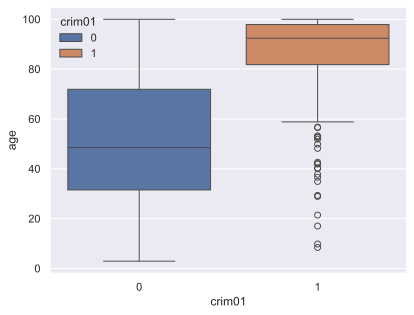

In [28]:
sns.boxplot(x = 'crim01', y = 'age', data = df_boston,  hue = 'crim01') 

In [29]:
sns.set()

sns.pairplot(df_boston[predlist2], kind='scatter', hue = 'crim01' )

plt.show()

### We expect dis, medv (median value of the owner occupied homes) to be good indicator of crim01 as well

<Axes: xlabel='crim01', ylabel='rad'>

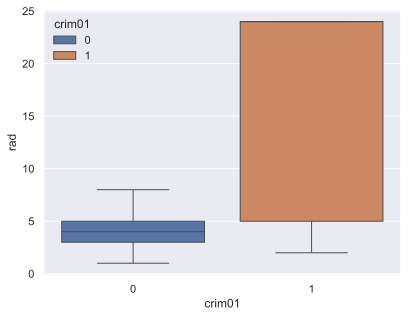

In [30]:
sns.boxplot(x = 'crim01', y = 'rad', data = df_boston,  hue = 'crim01') 

<Axes: xlabel='crim01', ylabel='tax'>

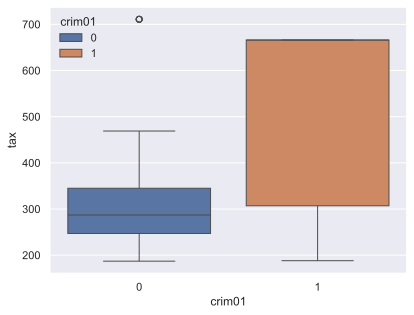

In [10]:
sns.boxplot(x = 'crim01', y = 'tax', data = df_boston,  hue = 'crim01') 

<Axes: xlabel='crim01', ylabel='lstat'>

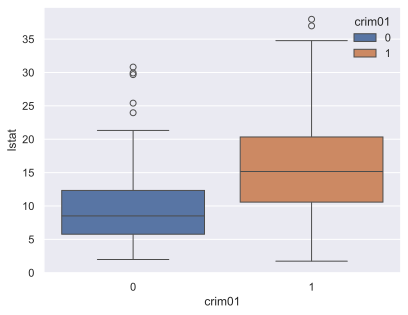

In [31]:
sns.boxplot(x = 'crim01', y = 'lstat', data = df_boston,  hue = 'crim01') 

### Some overlap of the median distribution on lstat but could be still a good indicator, we need to check the correlation heatmap to decide

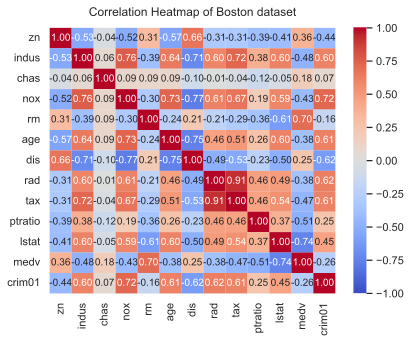

In [32]:
df = df_boston.drop('crim',axis=1)
corr_boston = df.corr()

heatmp = sns.heatmap(corr_boston, vmin=-1, vmax=1, annot = True, fmt=".2f", annot_kws={"size": 10}, cmap='coolwarm') # .corr() automatically ignores the qualitative 'Direction'

heatmp.set_title('Correlation Heatmap of Boston dataset', fontdict={'fontsize':12}, pad=12);

In [33]:

max_corr_list = np.abs(corr_boston['crim01']).sort_values(ascending=False)

print(max_corr_list)

crim01     1.000000
nox        0.723235
rad        0.619786
dis        0.616342
age        0.613940
tax        0.608741
indus      0.603260
lstat      0.453263
zn         0.436151
medv       0.263017
ptratio    0.253568
rm         0.156372
chas       0.070097
Name: crim01, dtype: float64


### We will consider attributes that has more than 50 percent correlation together with the full data set in what follows

In [34]:
max_corr_pred = max_corr_list[1:][max_corr_list[1:].values >= 0.5].index.to_list() # maximally correlated predictor list, we ignore the first item as it is the self correlation of crim01

In [35]:
### Lets scale the data first for better model performence as the predictor values vary on scale overall 

df.describe()

,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,lstat,medv,crim01
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,11.363636,11.136779,0.069170,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,12.653063,22.532806,0.500000
std,23.322453,6.860353,0.253994,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,7.141062,9.197104,0.500495
min,0.000000,0.460000,0.000000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,1.730000,5.000000,0.000000
25%,0.000000,5.190000,0.000000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,6.950000,17.025000,0.000000
50%,0.000000,9.690000,0.000000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,11.360000,21.200000,0.500000
75%,12.500000,18.100000,0.000000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,16.955000,25.000000,1.000000
max,100.000000,27.740000,1.000000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,37.970000,50.000000,1.000000


In [36]:
X_df_boston = df.drop('crim01', axis = 1)

scaler = StandardScaler(with_mean=True, with_std=True, copy = True) # scale all the features 

s_fit = scaler.fit(X_df_boston)

Xstd_boston = s_fit.transform(X_df_boston)

Xstd_boston_df = pd.DataFrame(Xstd_boston,columns = X_df_boston.columns)

Xstd_boston_df.head()

,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,lstat,medv
0,0.284830,-1.287909,-0.272599,-0.144217,0.413672,-0.120013,0.140214,-0.982843,-0.666608,-1.459000,-1.075562,0.159686
1,-0.487722,-0.593381,-0.272599,-0.740262,0.194274,0.367166,0.557160,-0.867883,-0.987329,-0.303094,-0.492439,-0.101524
2,-0.487722,-0.593381,-0.272599,-0.740262,1.282714,-0.265812,0.557160,-0.867883,-0.987329,-0.303094,-1.208727,1.324247
3,-0.487722,-1.306878,-0.272599,-0.835284,1.016303,-0.809889,1.077737,-0.752922,-1.106115,0.113032,-1.361517,1.182758
4,-0.487722,-1.306878,-0.272599,-0.835284,1.228577,-0.511180,1.077737,-0.752922,-1.106115,0.113032,-1.026501,1.487503


In [37]:
Xstd_boston_df.describe()

,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,lstat,medv
count,5.060000e+02,5.060000e+02,5.060000e+02,5.060000e+02,5.060000e+02,5.060000e+02,5.060000e+02,5.060000e+02,506.000000,5.060000e+02,5.060000e+02,5.060000e+02
mean,7.898820e-17,2.106352e-16,-3.510587e-17,-1.965929e-16,-1.088282e-16,-1.474446e-16,-8.425408e-17,-1.123388e-16,0.000000,-4.212704e-16,-3.089316e-16,-5.195668e-16
std,1.000990e+00,1.000990e+00,1.000990e+00,1.000990e+00,1.000990e+00,1.000990e+00,1.000990e+00,1.000990e+00,1.000990,1.000990e+00,1.000990e+00,1.000990e+00
min,-4.877224e-01,-1.557842e+00,-2.725986e-01,-1.465882e+00,-3.880249e+00,-2.335437e+00,-1.267069e+00,-9.828429e-01,-1.313990,-2.707379e+00,-1.531127e+00,-1.908226e+00
25%,-4.877224e-01,-8.676906e-01,-2.725986e-01,-9.130288e-01,-5.686303e-01,-8.374480e-01,-8.056878e-01,-6.379618e-01,-0.767576,-4.880391e-01,-7.994200e-01,-5.994557e-01
50%,-4.877224e-01,-2.110985e-01,-2.725986e-01,-1.442174e-01,-1.084655e-01,3.173816e-01,-2.793234e-01,-5.230014e-01,-0.464673,2.748590e-01,-1.812536e-01,-1.450593e-01
75%,4.877224e-02,1.015999e+00,-2.725986e-01,5.986790e-01,4.827678e-01,9.067981e-01,6.623709e-01,1.661245e+00,1.530926,8.065758e-01,6.030188e-01,2.685231e-01
max,3.804234e+00,2.422565e+00,3.668398e+00,2.732346e+00,3.555044e+00,1.117494e+00,3.960518e+00,1.661245e+00,1.798194,1.638828e+00,3.548771e+00,2.989460e+00


In [38]:
### Define feature and target variables for both dataset and perform train test splitting

Xf = Xstd_boston_df.values

Xsub = Xstd_boston_df[max_corr_pred].values

y = df['crim01']

Xf_train, Xf_test, y_train, y_test = train_test_split(Xf, y, random_state=1)

Xsub_train, Xsub_test, y_train, y_test = train_test_split(Xsub, y, random_state=1)

In [39]:
lR = LR()

lDA = LDA(store_covariance=False)

qDA = QDA(store_covariance=False)

nBC = GaussianNB()

models = [lDA,qDA,lR,nBC]

for model in models:

    model.fit(Xf_train, y_train)
    print(f"Overall accuracy of the {str(model)} on the test set using all features: {accuracy_score(model.predict(Xf_test),y_test) * 100:.3f}%") 
    model.fit(Xsub_train, y_train)    
    print(f"Overall accuracy of the {str(model)} on the test set using a subset of 6 maximally correlated features: {accuracy_score(model.predict(Xsub_test),y_test) * 100:.3f}%") 
    print('\n')

Overall accuracy of the LinearDiscriminantAnalysis() on the test set using all features: 85.827%
Overall accuracy of the LinearDiscriminantAnalysis() on the test set using a subset of 6 maximally correlated features: 81.890%


Overall accuracy of the QuadraticDiscriminantAnalysis() on the test set using all features: 92.913%
Overall accuracy of the QuadraticDiscriminantAnalysis() on the test set using a subset of 6 maximally correlated features: 87.402%


Overall accuracy of the LogisticRegression() on the test set using all features: 91.339%
Overall accuracy of the LogisticRegression() on the test set using a subset of 6 maximally correlated features: 87.402%


Overall accuracy of the GaussianNB() on the test set using all features: 77.165%
Overall accuracy of the GaussianNB() on the test set using a subset of 6 maximally correlated features: 81.102%




### Comments on the results: For all the methods above: i.e LDA, QDA, Logistic Regression, NaiveBayes, accuracy is larger when using the full data set. Best performing model in this data set is the QDA and since it performs better than (about 6 percent) LDA, we expect a non-linear Bayes decision boundary.  

In [40]:
for K in range(1,8):

    knn = KNN(n_neighbors=K)
    
    acc_score_f = accuracy_score(knn.fit(Xf_train, y_train).predict(Xf_test),y_test)
    acc_score_sub = accuracy_score(knn.fit(Xsub_train, y_train).predict(Xsub_test),y_test)

    print(f"Test accuracy of the KNN classifier with K = {K} for the full dataset: {acc_score_f:.5f}%")
    print(f"Test accuracy of the KNN classifier with K = {K} using a subset of 6 maximally correlaterd features: {acc_score_sub:.5f}%")
    print(f"\n")

Test accuracy of the KNN classifier with K = 1 for the full dataset: 0.91339%
Test accuracy of the KNN classifier with K = 1 using a subset of 6 maximally correlaterd features: 0.93701%


Test accuracy of the KNN classifier with K = 2 for the full dataset: 0.88189%
Test accuracy of the KNN classifier with K = 2 using a subset of 6 maximally correlaterd features: 0.92126%


Test accuracy of the KNN classifier with K = 3 for the full dataset: 0.90551%
Test accuracy of the KNN classifier with K = 3 using a subset of 6 maximally correlaterd features: 0.92126%


Test accuracy of the KNN classifier with K = 4 for the full dataset: 0.89764%
Test accuracy of the KNN classifier with K = 4 using a subset of 6 maximally correlaterd features: 0.91339%


Test accuracy of the KNN classifier with K = 5 for the full dataset: 0.91339%
Test accuracy of the KNN classifier with K = 5 using a subset of 6 maximally correlaterd features: 0.92126%


Test accuracy of the KNN classifier with K = 6 for the full 

### Comments: On the contrary, for all K values shown above, KNN performs better with the subset of predictors and the best model in this context is K = 1.